**Author:** Quilee Simeon (qsimeon@mit.edu)

# Generic setup code.

In [1]:
# #@title Installations.
# #@markdown

# # install Pytorch Geometric corresponding to version of Pytorch installed
# !pip install -q pyg-lib torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-1.13.0+cu117.html

# # needed to load certain *.mat file
# !pip install -q mat73

In [2]:
# @title Imports
# @markdown

import os
import pickle
import time
import copy
import random
import cycler
import mat73
import numpy as np
import networkx as nx
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

from matplotlib.lines import Line2D
from scipy import integrate, sparse
from scipy import linalg, signal
from scipy.io import loadmat
from tqdm import tqdm
from ipywidgets import IntProgress
from sklearn import preprocessing
from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import scale

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch_geometric
import torch_geometric.transforms as T

from torch_geometric.data import InMemoryDataset, Data
from torch_geometric.data import download_url, extract_zip
from torch_geometric.loader import DataLoader, NeighborLoader
from torch_geometric.nn import GATConv, GCNConv, SAGEConv, GraphConv
from torch_geometric.utils import coalesce

In [3]:
# @title Get GPU if available.

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cpu


# Real experimental neural data.

## We have obtained "whole brain" calcium imaging data from several open source datasets. 


|Paper Link             |Database Link     |Files w/ Data          |Num. ID'd| 
|-----------------------|------------------|-----------------------|---------|
|tinyurl.com/Uzel2022   |osf.io/3vkxn/     |`Uzel_WT.mat`          |54/154   |
|tinyurl.com/Kaplan20   |osf.io/9nfhz/     |`Neuron2019_Data_*.mat`|48/103   |
|tinyurl.com/Nguyen17   |tinyurl.com/LeiferIEEE|`heatData*.mat`    |0/156    | 
|tinyurl.com/Skora2018  |osf.io/za3gt/     |`WT_*.mat`             |40/139   |
|tinyurl.com/Nichols2017|osf.io/kbf38/     |`*let.mat`             |35/116   |
|tinyurl.com/Kato2015   |osf.io/2395t/     |`WT_*Stim.mat`         |38/109   |


In [4]:
# @title Let's load some real C. elegans data.
# @markdown These datasets were peprocessed from the open sources listed above.

# import helper functions
from data.load_neural_activity import load_dataset, pick_worm, find_reliable_neurons
from utils import VALID_DATASETS, NEURONS_302
from visualization.plot_worm_data import plot_worm_data
from visualization.plot_single_neuron_signals import plot_single_neuron_signals
from visualization.plot_neuron_train_test_samples import plot_neuron_train_test_samples

dict_keys(['worm0', 'worm1', 'worm2'])


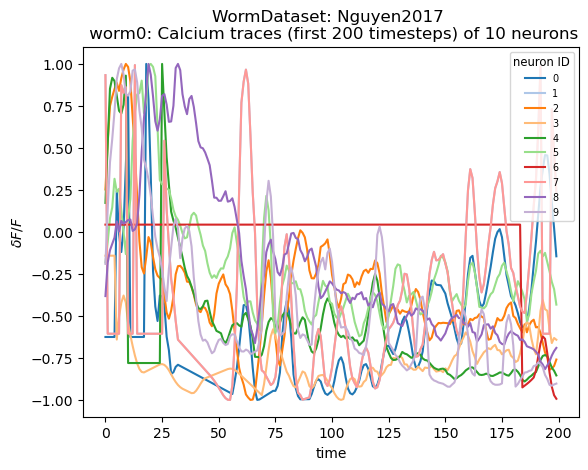

In [5]:
# @title Nguyen et al., PLOS CompBio 2017, _Automatically tracking neurons in a moving and deforming brain_
# @markdown Source: https://ieee-dataport.org/open-access/tracking-neurons-moving-and-deforming-brain-dataset

# load a dataset
Nguyen2017 = load_dataset("Nguyen2017")
print(Nguyen2017.keys())

# get data for one worm
worm = np.random.choice(list(Nguyen2017.keys()))
single_worm_dataset = pick_worm(Nguyen2017, worm)

# plot the calcium activity
plot_worm_data(single_worm_dataset, "WormDataset: Nguyen2017 \n %s" % worm)

dict_keys(['worm0', 'worm1', 'worm2', 'worm3', 'worm4', 'worm5', 'worm6', 'worm7', 'worm8', 'worm9', 'worm10', 'worm11'])


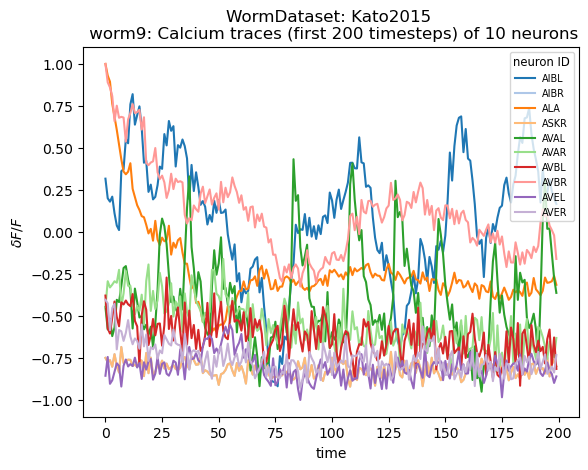

In [6]:
# @title Kato et al., Cell 2015, _Global Brain Dynamics Embed the Motor Command Sequence of Caenorhabditis elegans_
# @markdown Source: https://osf.io/2395t/

# load the dataset
Kato2015 = load_dataset("Kato2015")
print(Kato2015.keys())

# get data for one worm
worm = np.random.choice(list(Kato2015.keys()))
single_worm_dataset = pick_worm(Kato2015, worm)

# plot the calcium activity
plot_worm_data(single_worm_dataset, "WormDataset: Kato2015 \n %s" % worm)

dict_keys(['worm0', 'worm1', 'worm2', 'worm3', 'worm4', 'worm5', 'worm6', 'worm7', 'worm8', 'worm9', 'worm10', 'worm11', 'worm12', 'worm13', 'worm14', 'worm15', 'worm16', 'worm17', 'worm18', 'worm19', 'worm20', 'worm21', 'worm22', 'worm23', 'worm24', 'worm25', 'worm26', 'worm27', 'worm28', 'worm29', 'worm30', 'worm31', 'worm32', 'worm33', 'worm34', 'worm35', 'worm36', 'worm37', 'worm38', 'worm39', 'worm40', 'worm41', 'worm42', 'worm43'])


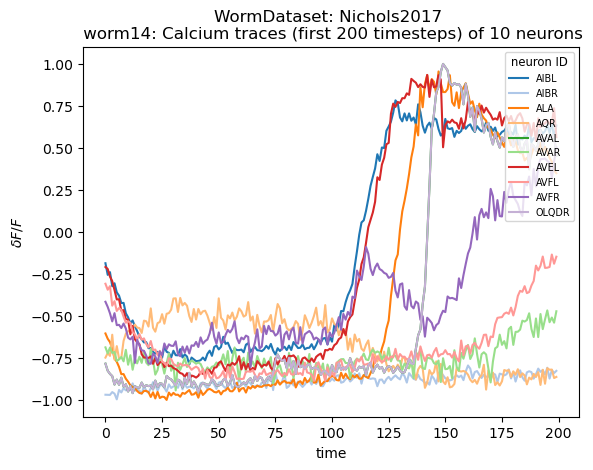

In [7]:
# @title Nichols et al., Science 2017, _A global brain state underlies C. elegans sleep behavior_
# @markdown Source: https://osf.io/kbf38/

# load the dataset
Nichols2017 = load_dataset("Nichols2017")
print(Nichols2017.keys())

# get data for one worm
worm = np.random.choice(list(Nichols2017.keys()))
single_worm_dataset = pick_worm(Nichols2017, worm)

# plot the calcium activity
plot_worm_data(single_worm_dataset, "WormDataset: Nichols2017 \n %s" % worm)

dict_keys(['worm0', 'worm1', 'worm2', 'worm3', 'worm4', 'worm5', 'worm6', 'worm7', 'worm8', 'worm9', 'worm10', 'worm11', 'worm12', 'worm13', 'worm14', 'worm15', 'worm16', 'worm17', 'worm18'])


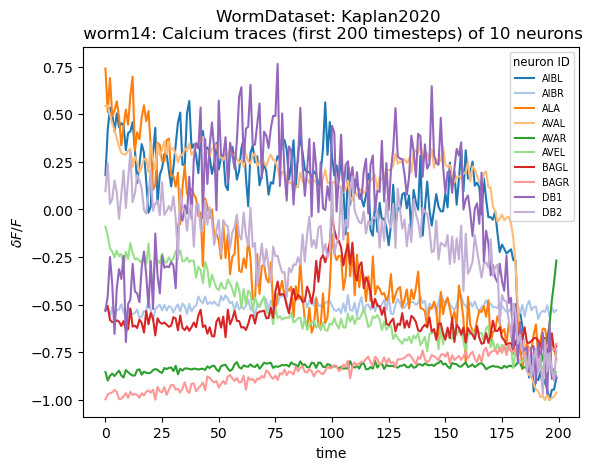

In [8]:
# @title Kaplan et al., Neuron 2020, _Nested Neuronal Dynamics Orchestrate a Behavioral Hierarchy across Timescales_
# @markdown Source: https://osf.io/9nfhz/

# load the dataset
Kaplan2020 = load_dataset("Kaplan2020")
print(Kaplan2020.keys())

# get data for one worm
worm = np.random.choice(list(Kaplan2020.keys()))
single_worm_dataset = pick_worm(Kaplan2020, worm)

# plot the calcium activity
plot_worm_data(single_worm_dataset, "WormDataset: Kaplan2020 \n %s" % worm)

dict_keys(['worm0', 'worm1', 'worm2', 'worm3', 'worm4', 'worm5'])


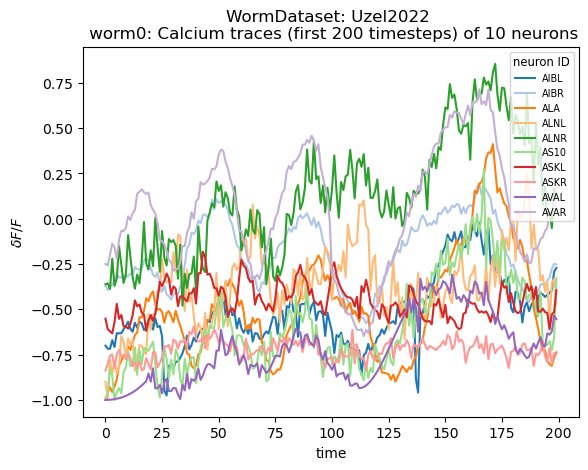

In [9]:
# @title Uzel et al., Cell CurrBio 2022, _A set of hub neurons and non-local connectivity features support global brain dynamics in C. elegans_
# @markdown Source: https://osf.io/3vkxn/

# # load the dataset
Uzel2022 = load_dataset("Uzel2022")
print(Uzel2022.keys())

# get data for one worm
worm = np.random.choice(list(Uzel2022.keys()))
single_worm_dataset = pick_worm(Uzel2022, worm)

# plot the calcium activity
plot_worm_data(single_worm_dataset, "WormDataset: Uzel2022 \n %s" % worm)

dict_keys(['worm0', 'worm1', 'worm2', 'worm3', 'worm4', 'worm5', 'worm6', 'worm7', 'worm8', 'worm9', 'worm10', 'worm11'])


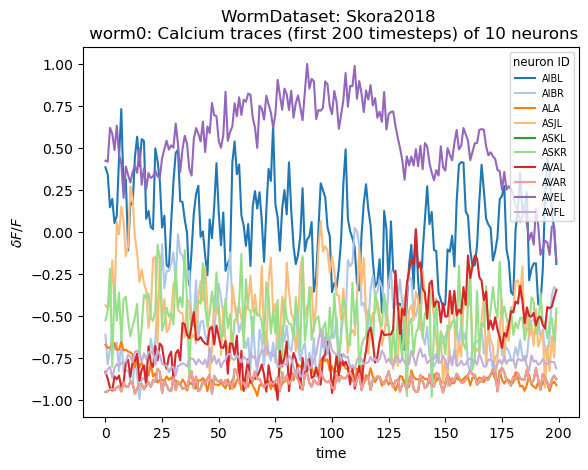

In [10]:
# @title Skora et al., Cell Reports 2018, _Energy Scarcity Promotes a Brain-wide Sleep State Modulated by Insulin Signaling in C. elegans_
# @markdown Source: https://osf.io/za3gt/

# # load the dataset
Skora2018 = load_dataset("Skora2018")
print(Skora2018.keys())

# get data for one worm
worm = np.random.choice(list(Skora2018.keys()))
single_worm_dataset = pick_worm(Skora2018, worm)

# plot the calcium activity
plot_worm_data(single_worm_dataset, "WormDataset: Skora2018 \n %s" % worm)

### What's the distinction between "whole-brain" and "whole-nervous system" recordings? 

The nervous system of the C. elegans hermaphrodite is composed of 302 neurons that are organized in several 
ganglia in the head and tail and into a spinal cord-like ventral nerve cord [1]. The majority of the neurons 
is located in the head, where they are organised in a number of ganglia surrounding the pharynx, forming the 
brain of the animal [2].

We will use the the richer whole-nervous system data, which is stored the file `Neuron2019_Data_RIShisCl.mat`. 

References:
- [1] http://www.wormbook.org/chapters/www_specnervsys.2/neurogenesis.html<br>
- [2] https://www.sfu.ca/biology/faculty/hutter/hutterlab/research/Ce_nervous_system.html<br>

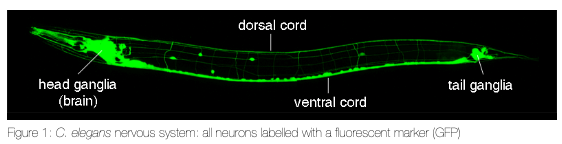

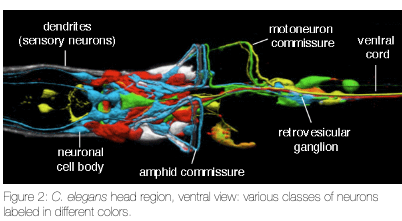

# Selecting single worm data.

This worm will be used in the rest of this notebook.

In [11]:
# @title Choose one of the datasets to explore with.
# @markdown

# choose your dataset
dataset_name = "Kato2015"
all_worms_dataset = load_dataset(dataset_name)
print("Chosen dataset:", dataset_name)
print("Total number of worms:", len(all_worms_dataset))
print()

Chosen dataset: Kato2015
Total number of worms: 12



In [12]:
# @title Find neurons that are consistently labelled across all worms in this dataset.
# @markdown By doing this for each of the datasets with labelled neurons, we
# @markdown found that only the "AVAL" neuron neuron was consistently labelled
# @markdown across all worms in all of the datasets.

# consistent neurons in the present dataset
intersection = find_reliable_neurons(all_worms_dataset)
print(
    len(intersection), "consistent neurons in this dataset:", intersection, end="\n\n"
)

# consistent neurons across all the datasets
stable_neurons = set(NEURONS_302)
for dn in VALID_DATASETS - {"Nguyen2017"}:
    stable_neurons &= set(find_reliable_neurons(load_dataset(dn)))
print(
    len(stable_neurons),
    "consistent neurons in all datasets:",
    sorted(stable_neurons),
    end="\n\n",
)

12 consistent neurons in this dataset: ['AIBL', 'AIBR', 'ALA', 'AVAL', 'AVAR', 'AVEL', 'RID', 'RIML', 'RIMR', 'RMED', 'RMEL', 'VB2']

1 consistent neurons in all datasets: ['AVAL']



### The AVAL neuron was reliably tracked across worms in multiple independent open source worm datasets.

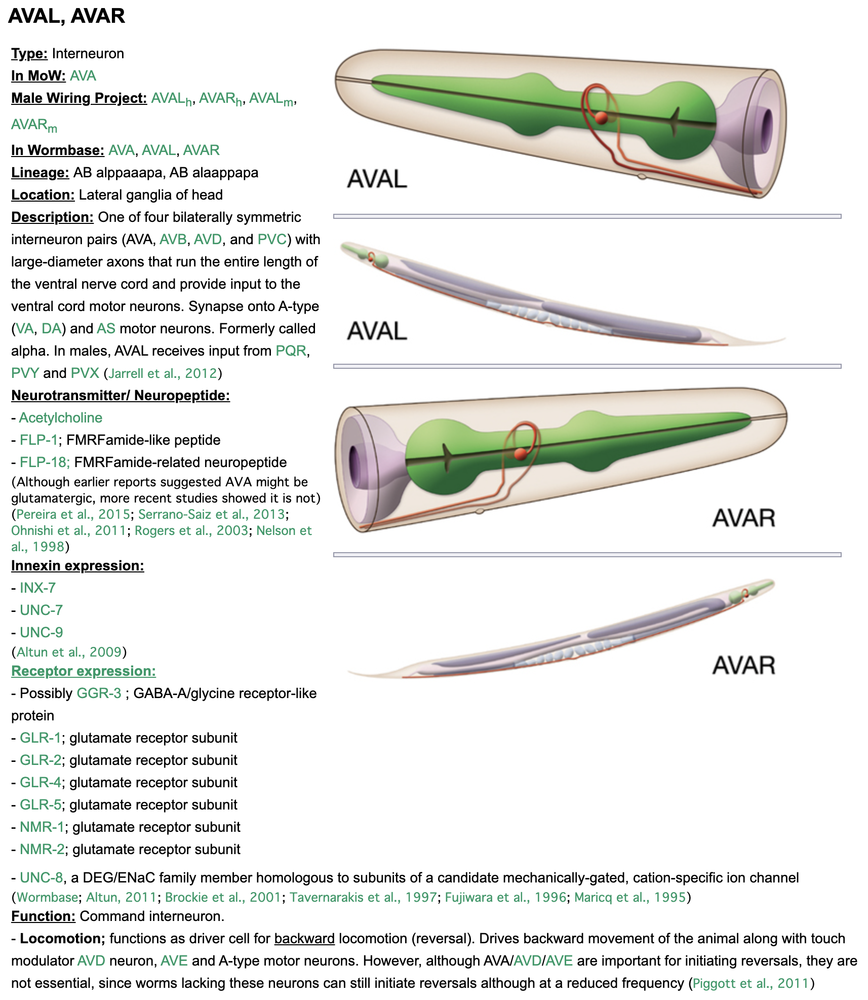


WORM0
mean residual: -0.0004663191689958474



/Users/quileesimeon/opt/anaconda3/envs/worm-graph/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


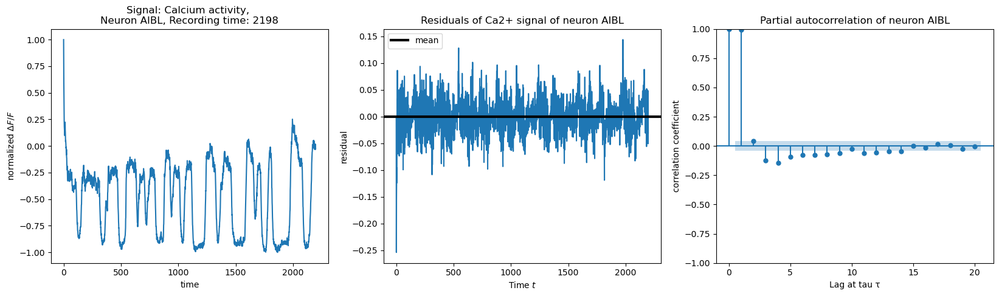

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM1
mean residual: -0.0007899112829513168



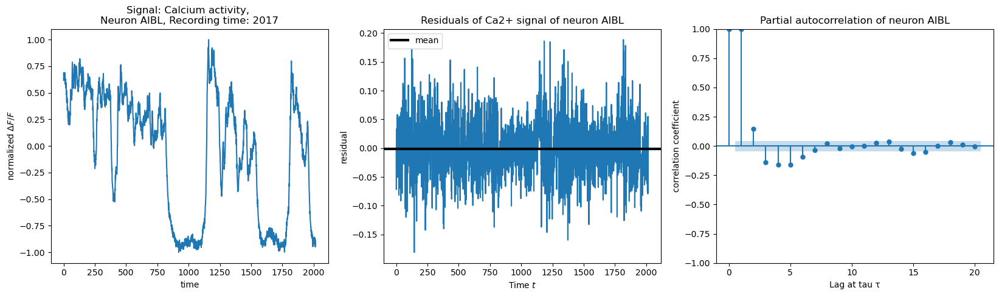

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM2
mean residual: -1.9852469399157604e-05



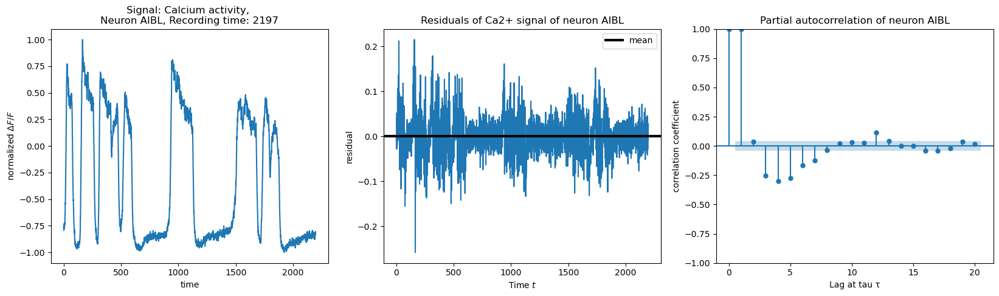

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM3
mean residual: -0.0006803321567850153



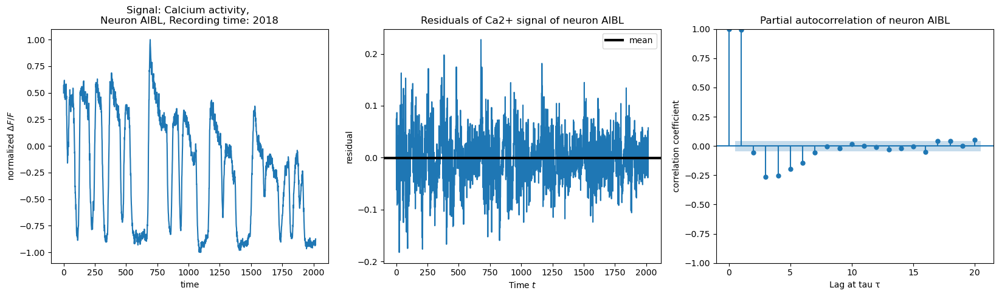

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM4
mean residual: 0.00010166422532020326



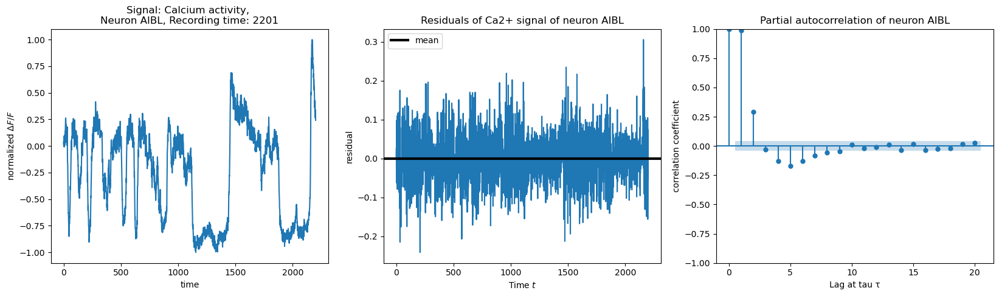

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM5
mean residual: -0.0002568715037317923



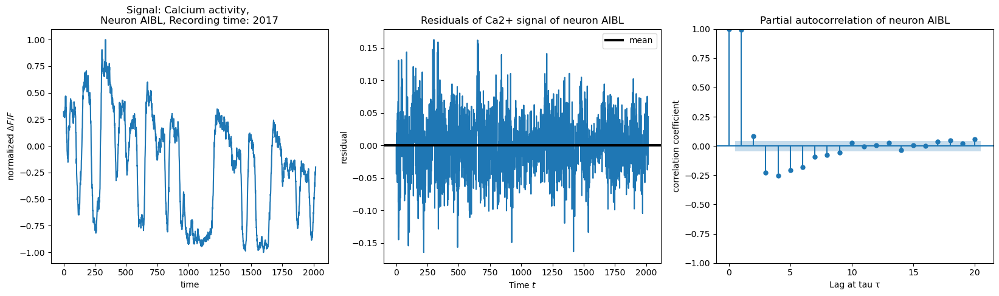

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM6
mean residual: -0.00038169662342535713



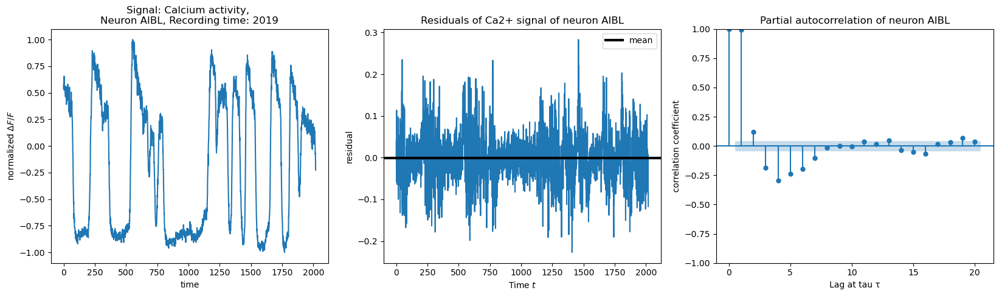

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM7
mean residual: -0.000259206593116965



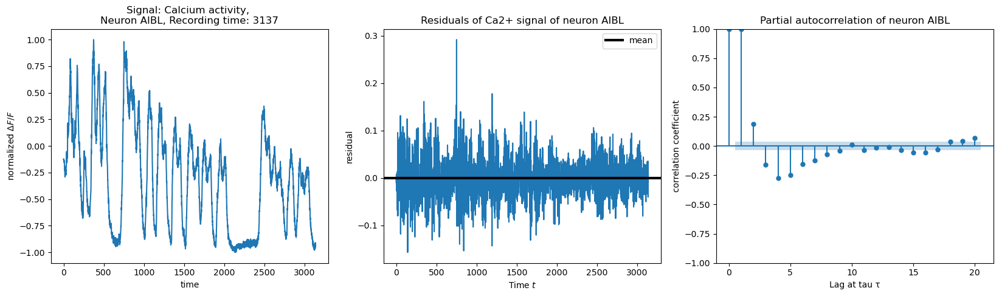

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM8
mean residual: -0.00038076338344977524



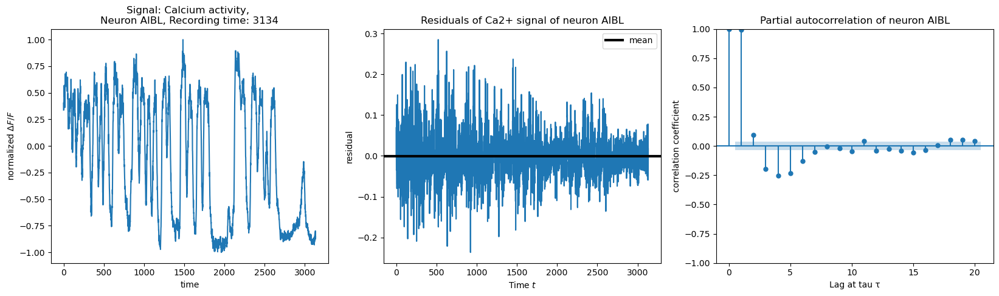

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM9
mean residual: -0.0003411038661103117



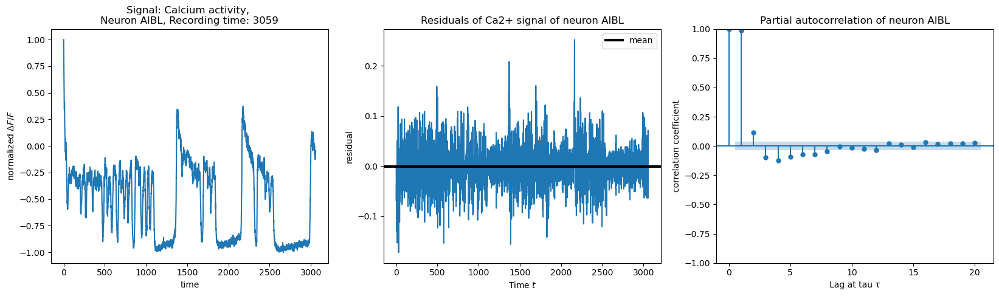

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM10
mean residual: -0.0005646850395353651



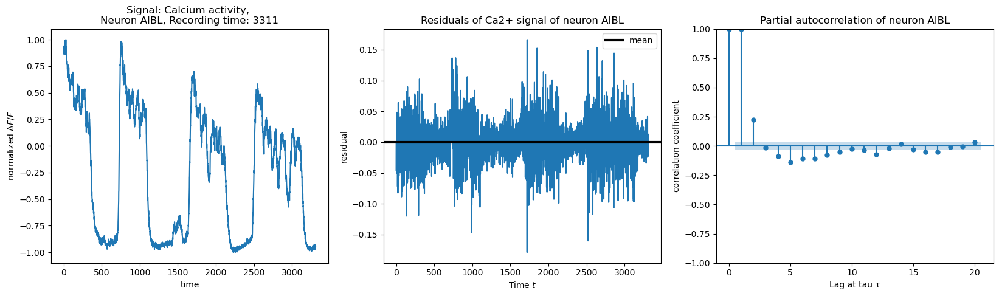

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM11
mean residual: 9.786531880740053e-06



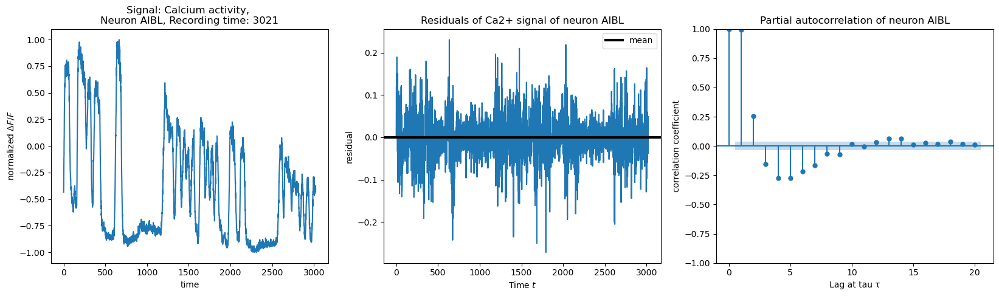

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [13]:
# @title Plot the time series of one consistently labelled neuron for each worm in the dataset.
# @markdown

neuron = np.random.choice(intersection)  # pick consistent neuron
for i, worm in enumerate(all_worms_dataset):
    print()
    print(worm.upper())
    single_worm_dataset = pick_worm(all_worms_dataset, worm)
    neuron_to_idx = single_worm_dataset["named_neuron_to_idx"]
    neuron_idx = neuron_to_idx[neuron]
    plot_single_neuron_signals(single_worm_dataset, neuron_idx)
    print("~~~" * 60)


WORM0


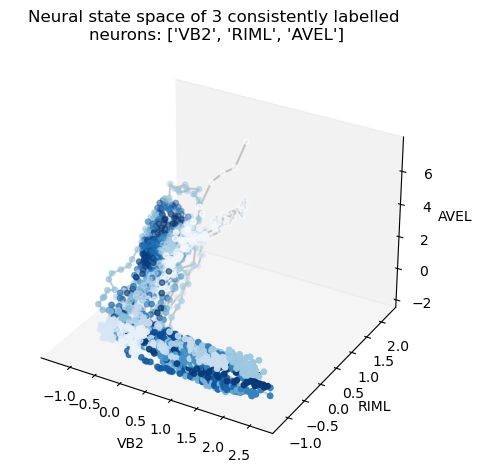

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM1


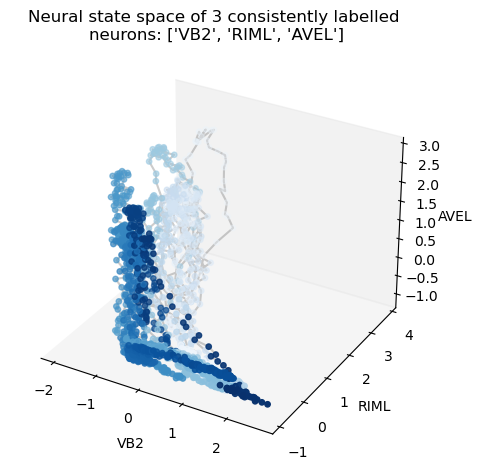

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM2


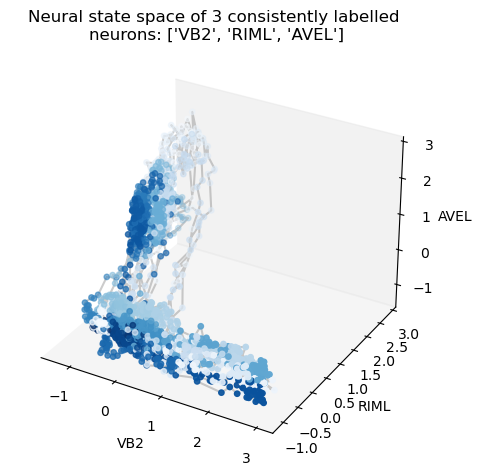

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM3


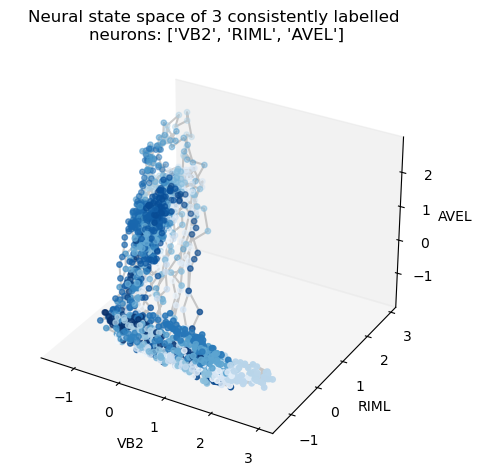

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM4


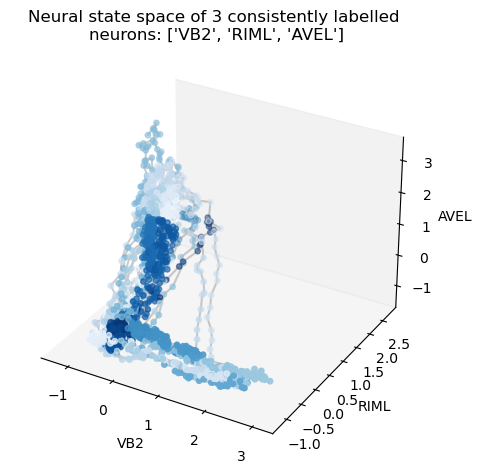

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM5


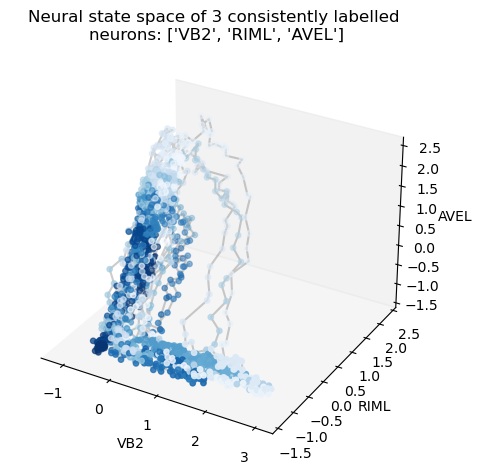

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM6


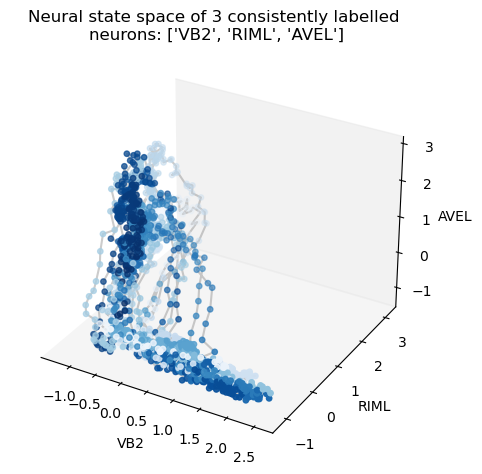

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM7


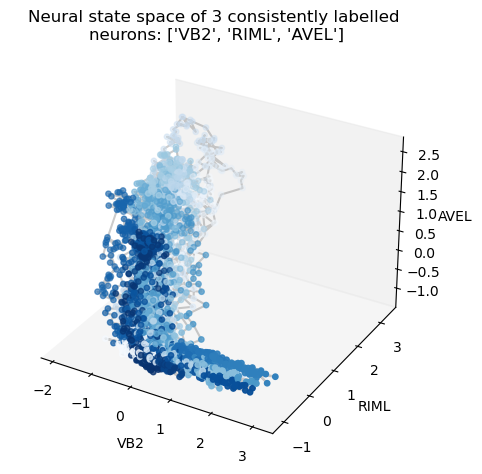

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM8


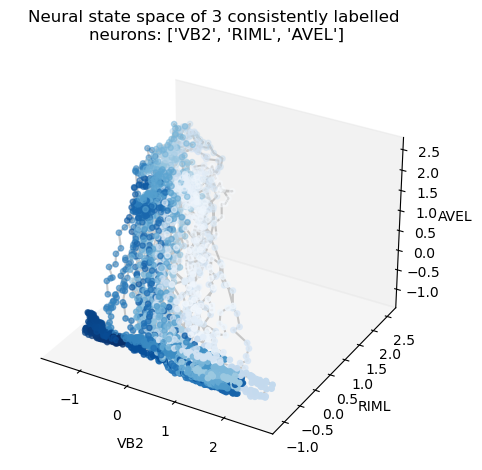

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM9


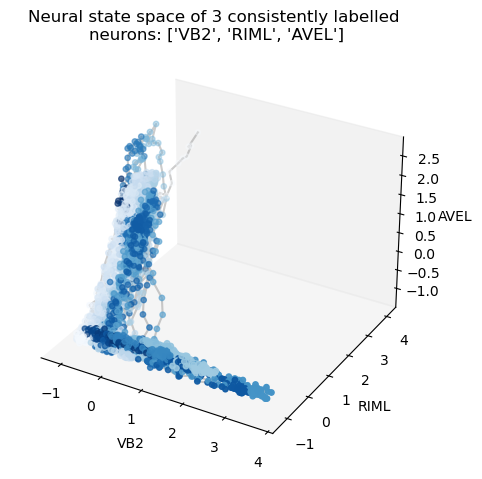

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM10


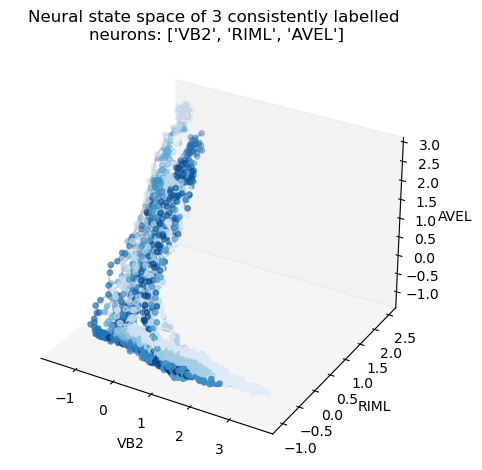

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM11


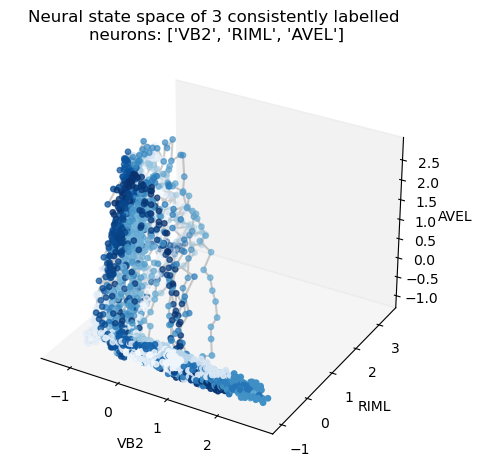

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [14]:
# @title For each worm, plot the neural activity state-space of 2 or 3 neurons which are consistently labelled across worms.
# @markdown

inds = np.random.choice(
    np.arange(len(intersection)), min(len(intersection), 3), replace=False
)
neurons = np.array(intersection)[inds].tolist()

for i, worm in enumerate(all_worms_dataset):
    print()
    print(worm.upper())
    # retrieve this worm's data
    single_worm_dataset = pick_worm(all_worms_dataset, worm)
    # unpack the calcium data
    neuron_to_idx = single_worm_dataset["named_neuron_to_idx"]
    max_time = single_worm_dataset["max_time"]
    # get the data for the 3 selected neurons
    named_data = single_worm_dataset["named_data"].squeeze().numpy()
    indices = np.array([neuron_to_idx[neuron] for neuron in neurons])
    neurons_data = named_data[:, indices]
    neurons_data = scale(neurons_data)
    # plot the state space
    if len(intersection) <= 2:
        ax = plt.axes(projection=None)
        ax.plot(
            neurons_data[:, 0],
            neurons_data[:, neurons_data.shape[1] - 1],
            "gray",
            alpha=0.2,
        )
        ax.scatter(
            neurons_data[:, 0],
            neurons_data[:, neurons_data.shape[1] - 1],
            c=np.arange(max_time),
            s=15,
            cmap="Blues",
            edgecolors="face",
        )
        ax.set_title(
            "Neural state space of 2 consistently labelled \nneurons: %s" % neurons
        )
    else:
        ax = plt.axes(projection="3d")
        ax.grid(False)
        ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.plot3D(
            neurons_data[:, 0],
            neurons_data[:, 1],
            neurons_data[:, 2],
            "gray",
            alpha=0.4,
        )
        ax.scatter3D(
            neurons_data[:, 0],
            neurons_data[:, 1],
            neurons_data[:, 2],
            c=np.arange(max_time),
            s=15,
            cmap="Blues",
            edgecolors="face",
        )
        ax.set_title(
            "Neural state space of 3 consistently labelled \nneurons: %s" % neurons
        )
        ax.set_zlabel(neurons[2])
    ax.set_xlabel(neurons[0])
    ax.set_ylabel(neurons[1])
    plt.tight_layout()
    plt.show()
    print("~~~" * 60)


WORM0


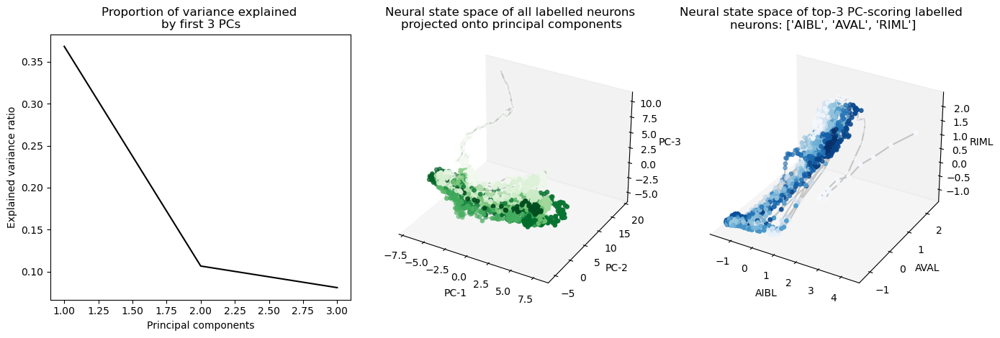

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM1


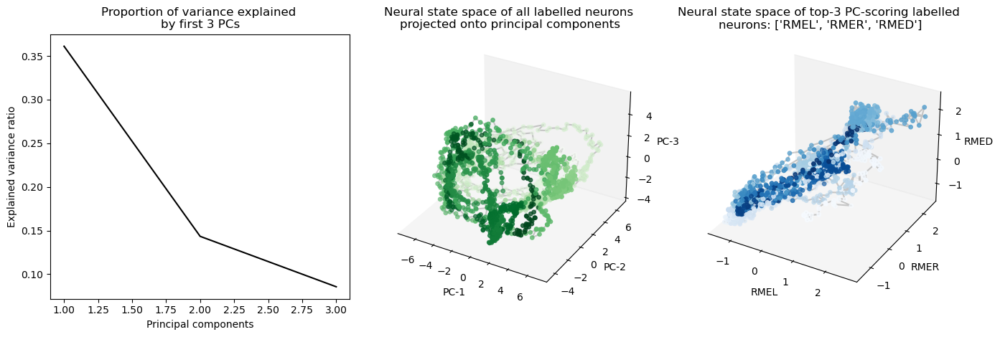

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM2


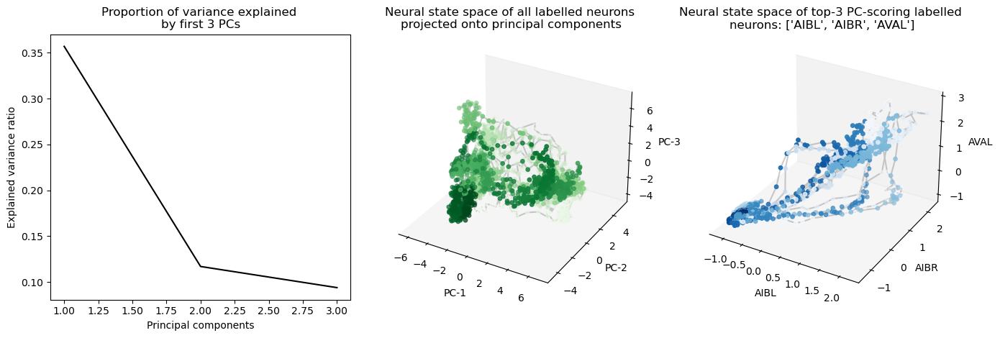

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM3


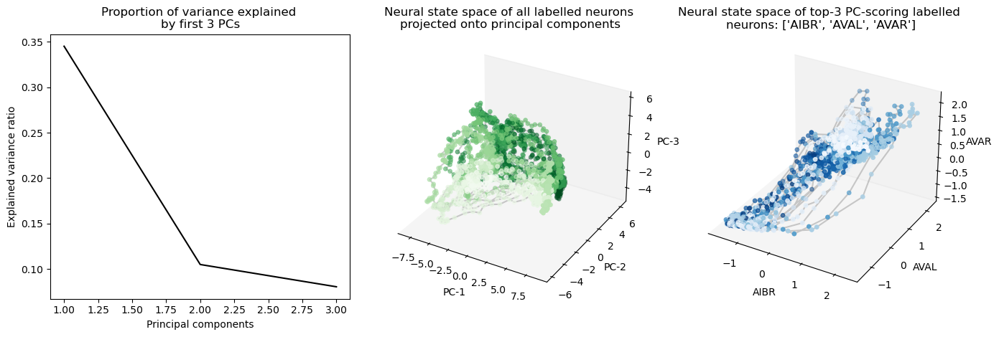

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM4


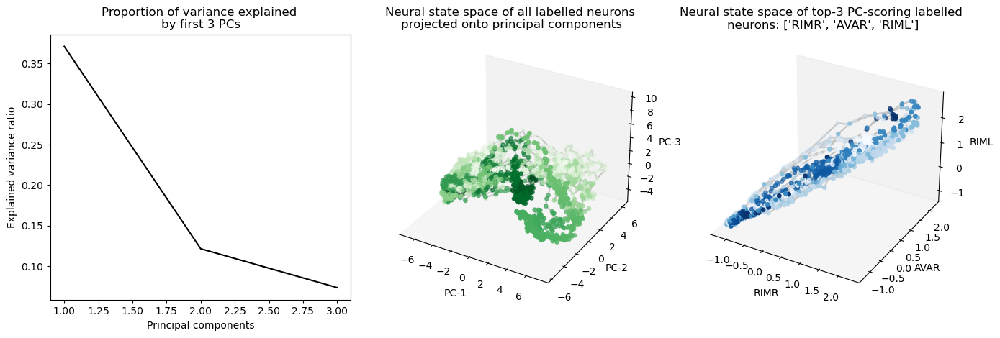

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM5


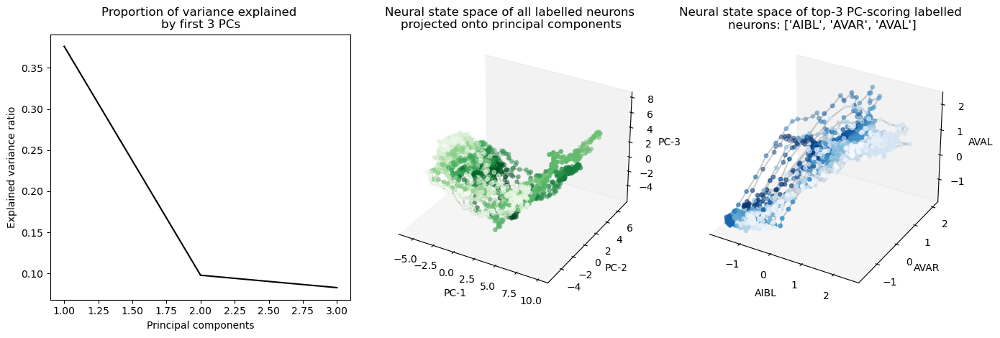

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM6


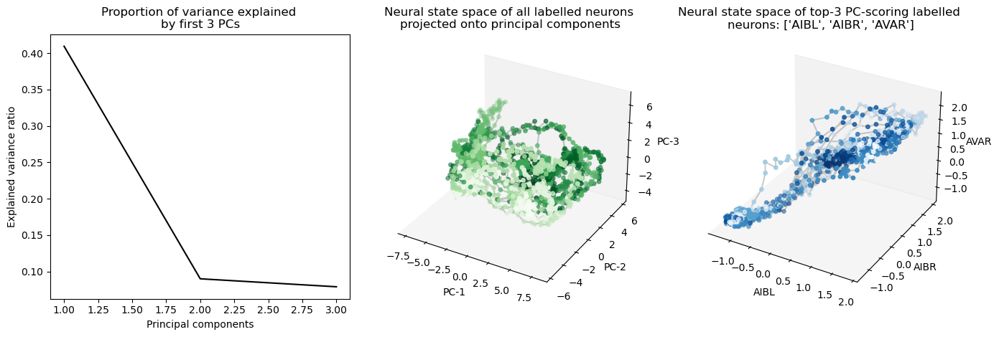

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM7


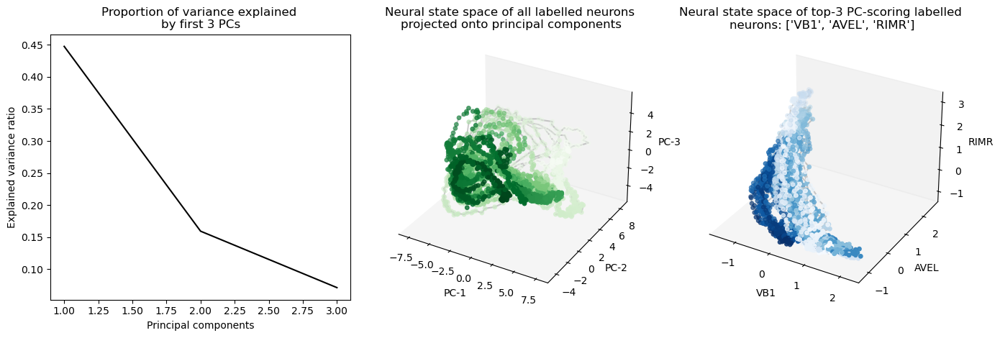

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM8


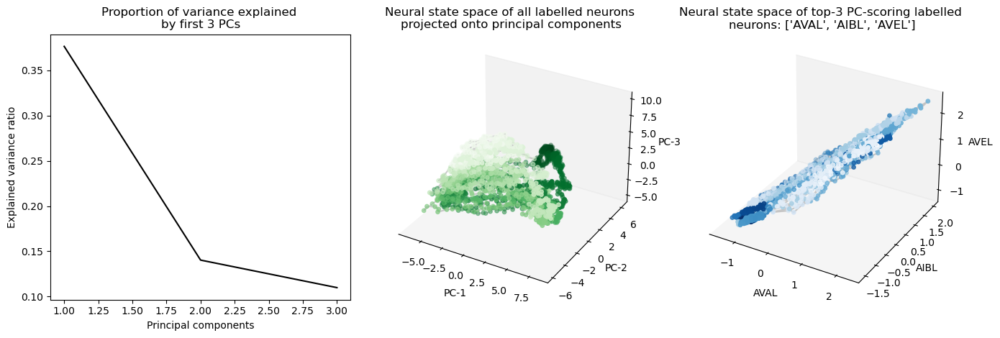

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM9


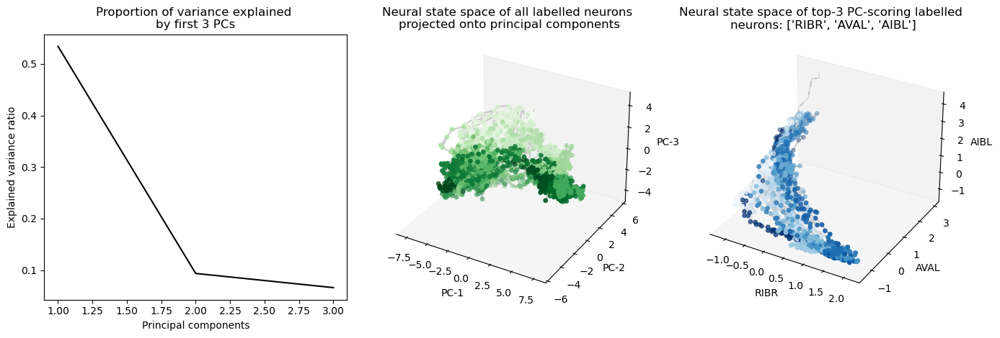

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM10


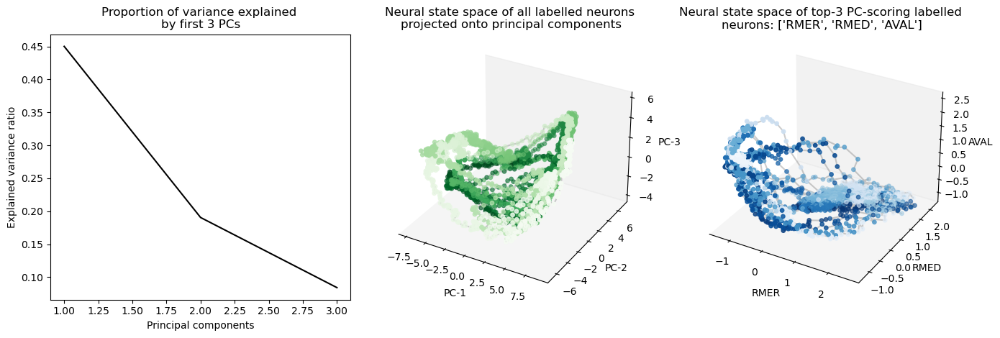

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

WORM11


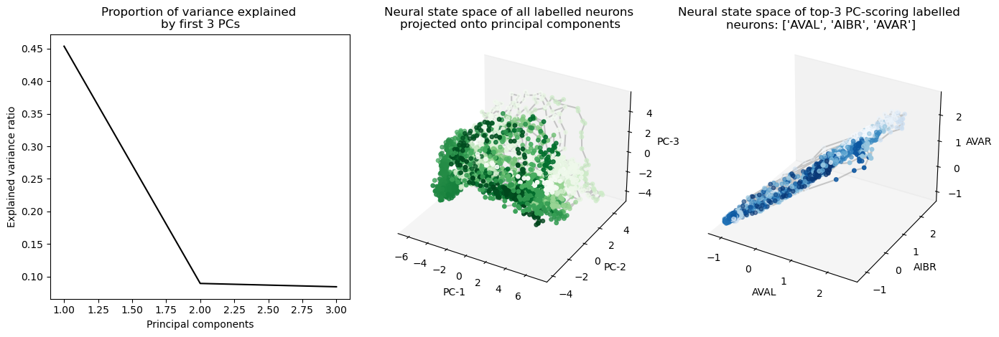

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [15]:
# @title Perform PCA on the neural state space.
# @markdown

for i, worm in enumerate(all_worms_dataset):
    print()
    print(worm.upper())

    single_worm_dataset = pick_worm(all_worms_dataset, worm)
    neuron_to_idx = single_worm_dataset["named_neuron_to_idx"]
    max_time = single_worm_dataset["max_time"]
    named_data = single_worm_dataset["named_data"].squeeze().numpy()

    pca = PCA(n_components=3)
    indices = list(neuron_to_idx.values())
    neurons_data = named_data[:, indices]
    X = scale(neurons_data)
    X = pca.fit_transform(X)

    loadings = pca.components_.T
    loading_matrix = pd.DataFrame(
        loadings, columns=["PC1", "PC2", "PC3"], index=neuron_to_idx.keys()
    )
    loading_matrix.sort_values(by="PC1", key=abs, ascending=False, inplace=True)

    top3_neurons = loading_matrix.index[0:3].tolist()
    top3_indices = list(neuron_to_idx[neuron] for neuron in top3_neurons)
    neurons_data = named_data[:, top3_indices]
    D = scale(neurons_data)

    fig = plt.figure(figsize=plt.figaspect(0.35), layout="tight")

    ax = fig.add_subplot(1, 3, 1)
    ax.plot([1, 2, 3], pca.explained_variance_ratio_, color="black")
    ax.set_title("Proportion of variance explained \nby first 3 PCs")
    ax.set_ylabel("Explained variance ratio")
    ax.set_xlabel("Principal components")

    ax = fig.add_subplot(1, 3, 2, projection="3d")
    ax.grid(False)
    ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.plot3D(X[:, 0], X[:, 1], X[:, 2], "gray", alpha=0.4)
    ax.scatter3D(
        X[:, 0],
        X[:, 1],
        X[:, 2],
        c=np.arange(max_time),
        s=15,
        cmap="Greens",
        edgecolors="face",
    )
    ax.set_xlabel("PC-1")
    ax.set_ylabel("PC-2")
    ax.set_zlabel("PC-3")
    ax.set_title(
        "Neural state space of all labelled neurons \nprojected onto principal components"
    )

    ax = fig.add_subplot(1, 3, 3, projection="3d")
    ax.grid(False)
    ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.plot3D(D[:, 0], D[:, 1], D[:, 2], "gray", alpha=0.4)
    ax.scatter3D(
        D[:, 0],
        D[:, 1],
        D[:, 2],
        c=np.arange(max_time),
        s=15,
        cmap="Blues",
        edgecolors="face",
    )
    ax.set_xlabel(top3_neurons[0])
    ax.set_ylabel(top3_neurons[1])
    ax.set_zlabel(top3_neurons[2])
    ax.set_title(
        "Neural state space of top-3 PC-scoring labelled \nneurons: %s" % top3_neurons
    )

    plt.show()
    print("~~~" * 60)

In [16]:
# @title Now pick one worm from the chosen dataset.
# @markdown

# get data for one worm
worm = np.random.choice(list(all_worms_dataset.keys()))
single_worm_dataset = pick_worm(all_worms_dataset, worm)
print("Picked worm:", worm)
print()

# get the calcium data for this worm
all_calcium_data = single_worm_dataset["all_data"]
print("Worm calcium-signal dataset:", all_calcium_data.shape)
print()

# get max time and number of neurons
max_time = single_worm_dataset["max_time"]
num_neurons = single_worm_dataset["num_neurons"]
print("Recording length: %s \nNumber of neurons: %s" % (max_time, num_neurons))
print()

Picked worm: worm1

Worm calcium-signal dataset: torch.Size([2017, 122, 1])

Recording length: 2017 
Number of neurons: 122



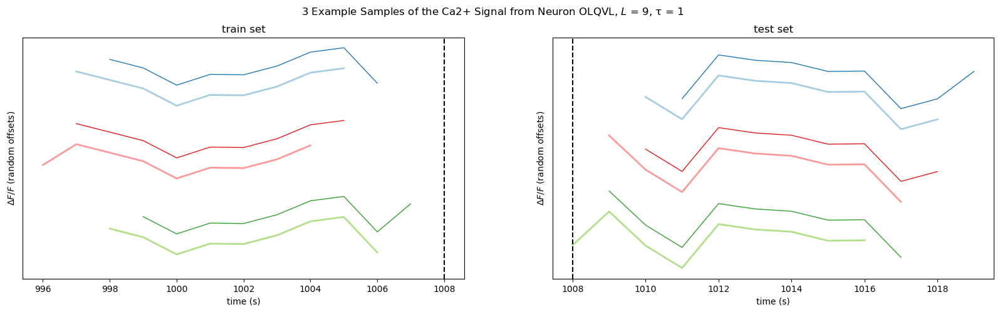

In [17]:
# @title Visualize example train and test samples for a single neuron.
# @markdown

# get the neuron to idx map
neuron_to_idx = single_worm_dataset["named_neuron_to_idx"]
# pick a neuron
neuron_idx = np.random.choice(list(neuron_to_idx.values()))
# plot train and test samples
plot_neuron_train_test_samples(
    single_worm_dataset, neuron_idx, num_samples=3, seq_len=9, tau=1
)

# Pytorch dataloaders for our data.


In [18]:
# @title Map-style dataset.
# @markdown We have implemented a datset `MapDataset` and associated batch sampler
# @markdown `BatchSampler` in `worm_utils.py`.<br> This cell is only meant to illustrate
# @markdown how to build a dataset and dataloader.

from data.map_dataset import MapDataset
from data.batch_sampler import BatchSampler

# build a dataset with common shape (302 neurons)
named_calcium_data = single_worm_dataset["named_data"]
neurons_mask = single_worm_dataset["neurons_mask"]
dataset = MapDataset(named_calcium_data, seq_len=[7, 9], size=2 * max_time)
print("size", dataset.size, "features", dataset.num_features)
print()

# each batch contains all samples of a fixed length
data_sampler = BatchSampler(dataset.batch_indices)
loader = torch.utils.data.DataLoader(dataset, batch_sampler=data_sampler)

# testing the data-loader
gen = iter(loader)
X, Y, meta = next(gen)
print(
    "First batch:",
    X.shape,
    Y.shape,
    list(map(lambda item: (item[0], item[-1].shape), meta.items())),
)
print()
X, Y, meta = next(gen)
print(
    "Second batch:",
    X.shape,
    Y.shape,
    list(map(lambda item: (item[0], item[-1].shape), meta.items())),
)
print()
print("Data on GPU?", X.is_cuda, Y.is_cuda)  # check if data on GPU

size 4018 features 302

First batch: torch.Size([2008, 9, 302]) torch.Size([2008, 9, 302]) [('seq_len', torch.Size([2008])), ('start', torch.Size([2008])), ('end', torch.Size([2008])), ('tau', torch.Size([2008]))]

Second batch: torch.Size([2010, 7, 302]) torch.Size([2010, 7, 302]) [('seq_len', torch.Size([2010])), ('start', torch.Size([2010])), ('end', torch.Size([2010])), ('tau', torch.Size([2010]))]

Data on GPU? False False


# _C. elegans_ residual neural activity prediction models.

We will train several different models to predict the residuals of real *C. elegans* neural activity and then plot loss function curves for various hyperparameters.

We would like to build models that take an arbitray length $L$ time-series of *C. elegans* neural activty and outputs a length $L$ time-series of the residuals of future neural activity.


For all models, we create datasets of sequences (slices of neural recordings).
The training dataset is made from the first half of the recordings.
The test dataset is made from the second half of the recordings.

## Linear model.



#### Using linear regression to predict $\Delta Y = Y(t+1) - Y(t)$ given $Y(t)$.

How well can we do with a linear classifier that predicts the residual $\Delta Y = Y(t+1) - Y(t)$ given $Y(t)$ as input?

**Model:** $\Delta Y = W^{\top}Y(t)$.

The target is just the value at the next time-step ($\tau=1$).

$W$ is learned by a simple 1-layer feed-forward neural network via stochastic gradient descent.

In [ ]:
# @title Train a simple linear regression model.
# @markdown

from models.linear_models import LinearNN
from train.train_main import optimize_model, model_predict

# create the model
lin_model = LinearNN(input_size=302).double()

# store the initial weights
untrained_weights = lin_model.linear.weight.detach().cpu()

# optimize the model (use default settings)
lin_model, log = optimize_model(
    dataset=named_calcium_data,
    model=lin_model,
    mask=neurons_mask,
    seq_len=range(17, 22, 1),
    num_epochs=100,
)

# get the trained weights
trained_weights = lin_model.linear.weight.detach().cpu()

In [ ]:
# @title Plot loss curves for the linear model.
# @markdown

from visualization.plot_loss_log import plot_loss_log
from visualization.plot_before_after_weights import plot_before_after_weights

# plot loss curves
plot_loss_log(
    log,
    plt_title="%s, %s neurons, data size %s, seq. len %s \n "
    "Linear Model: $\Delta Y(t) = W^{\intercal} Y(t)$ loss "
    "curves" % (worm.upper(), num_neurons, log["data_size"], log["seq_len"]),
)

# trained vs untrained weights
plot_before_after_weights(untrained_weights, trained_weights, W_name="W")

In [ ]:
# @title Make predictions with the trained linear model.
# @markdown

from visualization.plot_target_prediction import plot_target_prediction
from visualization.plot_correlation_scatter import plot_correlation_scatter
from train.train_main import model_predict

targets, predictions = model_predict(named_calcium_data, lin_model)

# plot prediction for a single neuron
plot_target_prediction(
    targets[:, neuron_idx],
    predictions[:, neuron_idx],
    plt_title="%s, neuron %s, data size %s, seq. len %s \n "
    "Linear model: Ca2+ residuals prediction"
    % (worm.upper(), neuron, log["data_size"], log["seq_len"]),
)

# plot scatterplot of all neuron predictions
plot_correlation_scatter(
    targets[:, neurons_mask],
    predictions[:, neurons_mask],
    plt_title="%s, %s neurons, data size %s, \n Linear "
    "Model: Correlation of all neuron Ca2+ residuals"
    % (worm.upper(), num_neurons, log["data_size"]),
)

In [ ]:
# @title Train the linear model on increasingly more data.
# @markdown

from train.scaling_train import more_data_training
from visualization.plot_more_data_losses import plot_more_data_losses

results = more_data_training(
    LinearNN,
    single_worm_dataset,
    seq_len=range(17, 22, 1),
    num_epochs=100,
    worm=worm,
    model_name="Linear",
)

model, log = results[-1]
worm, seq_len, num_neurons = log["worm"], log["seq_len"], log["num_neurons"]

plot_more_data_losses(
    results,
    plt_title="%s, %s neurons, seq. len %s \n Linear"
    " Model: Loss curves from scaling dataset size"
    % (worm.upper(), num_neurons, seq_len),
)

In [ ]:
# @title Train the linear model on multiple worms.
# @markdown

from worm_utils import plot_multi_worm_losses

results = multi_worm_training(
    LinearNN,
    all_worms_dataset,
    seq_len=range(17, 22, 1),
    num_epochs=500,
    model_name="Linear",
)

num_worms = len(results)
model, log = results[-1]
seq_len = log["seq_len"]

plot_multi_worm_losses(
    results,
    plt_title="%s worms, seq. len %s \n Linear "
    "Model: Loss curves from different worms" % (num_worms, seq_len),
)

In [ ]:
# @title Train the linear model on many worms and test on a held-out worm.
# @markdown

log = leave_one_worm_out_training(
    LinearNN,
    all_worms_dataset,
    seq_len=range(17, 22, 1),
    num_epochs=500,
    model_name="Linear",
)

## RNN model.

### Using an LSTM model to predict $\vec{\Delta Y}$ given $\vec{Y}$.

We train an LSTM (a type of recurrent neural network, RNN) to output the next $L$ residuals $\begin{bmatrix} Y(t-L+2)-Y(t-L+1),\: Y(t-L+3)-Y(t-L+2),\: \dots,\: Y(t)-Y(t-1),\: \mathbf{Y(t+1)-Y(t)} \end{bmatrix}^{\top}$ given an input sequence $\begin{bmatrix} Y(t-L+1),\: Y(t-L+2),\: \dots,\: Y(t-1),\: \mathbf{Y(t)}\end{bmatrix}^{\top}$ of length $L$.

**Model:** $\Delta \vec{Y(t)} = f \left( \vec{Y(t)}; h_{t-1}, C_{t-1} \right), \: t=1,2,\dots, L$

The target is now the sequences of values at the next $L$ time-steps ($\tau=1$).

Notice how the linear model from earlier was like a **special case** of a sequence with unit length $L=1$.

In [ ]:
# @title Train a NetworkLSTM model.
# @markdown By "network" we mean that a single LSTM models the
# @markdown entire network of neurons, rather than modeling each
# @markdown neuron as an LSTM.

from worm_utils import NetworkLSTM

# create the model and place on GPU
lstm_model = NetworkLSTM(input_size=302, hidden_size=302).double()

# store the initial input-output weights
_, _, _, init_W_io = np.split(lstm_model.lstm.weight_ih_l0.detach().cpu(), 4)

# optimize the model (use default settings)
lstm_model, log = optimize_model(
    dataset=new_calcium_data,
    model=lstm_model,
    mask=mask,
    seq_len=range(17, 22, 1),
    num_epochs=500,
)

# get the trained weights
_, _, _, final_W_io = np.split(lstm_model.lstm.weight_ih_l0.detach().cpu(), 4)

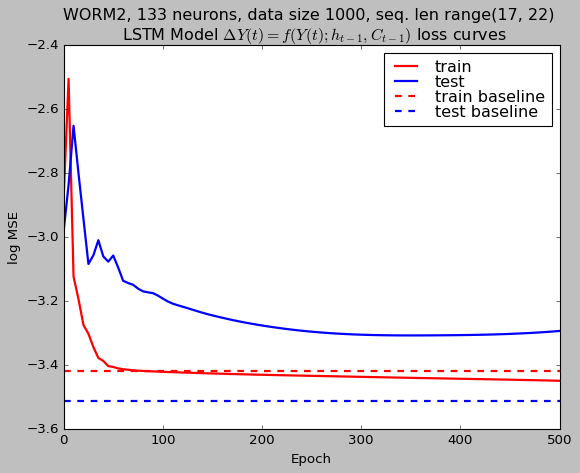

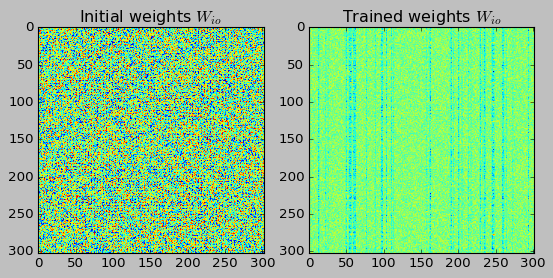

In [ ]:
# @title Plot loss curves for the LSTM model.
# @markdown

# plot loss curves
plot_loss_log(
    log,
    plt_title="%s, %s neurons, data size %s, seq. len %s \n LSTM"
    " Model $\Delta Y(t) = f ( Y(t); h_{t-1}, C_{t-1} )$ loss curves"
    % (worm.upper(), num_neurons, log["data_size"], log["seq_len"]),
)

# trained vs untrained weights
plot_before_after_weights(init_W_io, final_W_io, W_name="$W_{io}$")

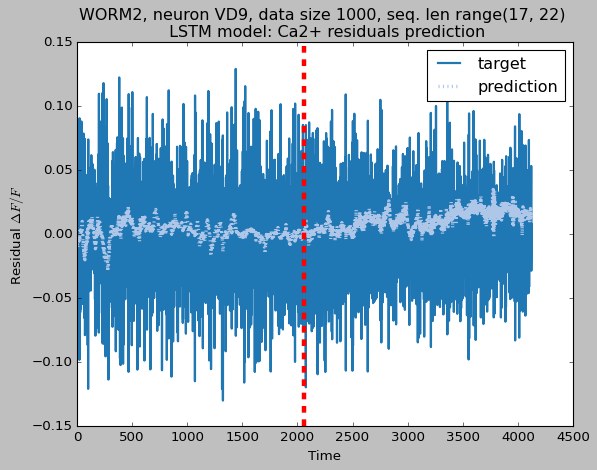


model test performance: tensor(0.0008, dtype=torch.float64)

signs flipped: tensor(0.0009, dtype=torch.float64)

baseline: tensor(0.0006, dtype=torch.float64)


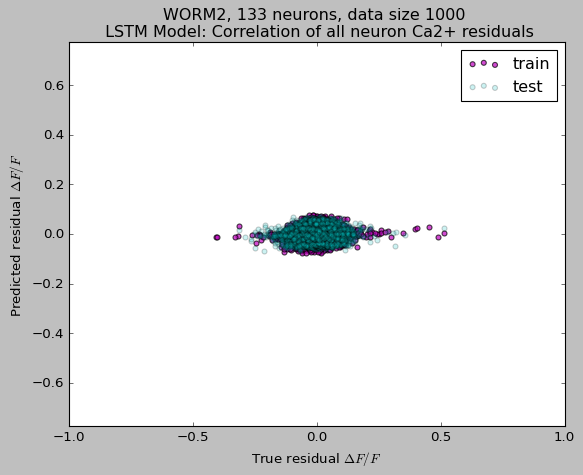

In [ ]:
# @title Make predictions with the trained LSTM model.
# @markdown

targets, predictions = model_predict(new_calcium_data, lstm_model)

# plot prediction for a single neuron
plot_target_prediction(
    targets[:, slot_idx],
    predictions[:, slot_idx],
    plt_title="%s, neuron %s, data size %s, seq. len %s \n "
    "LSTM model: Ca2+ residuals prediction"
    % (worm.upper(), neuron, log["data_size"], log["seq_len"]),
)

# plot scatterplot of all neuron predictions
plot_correlation_scatter(
    targets[:, mask],
    predictions[:, mask],
    plt_title="%s, %s neurons, data size %s \n LSTM Model:"
    " Correlation of all neuron Ca2+ residuals"
    % (worm.upper(), num_neurons, log["data_size"]),
)

In [ ]:
# @title Train the LSTM model on increasingly more data.
# @markdown

results = more_data_training(
    NetworkLSTM,
    single_worm_dataset,
    worm=worm,
    seq_len=range(17, 22, 1),
    num_epochs=500,
    model_name="LSTM",
)

model, log = results[-1]
worm, seq_len, num_neurons = log["worm"], log["seq_len"], log["num_neurons"]

plot_more_data_losses(
    results,
    plt_title="%s, %s neurons, seq. len %s \n LSTM "
    "Model: Loss curves from scaling dataset size"
    % (worm.upper(), num_neurons, seq_len),
)

In [ ]:
# @title Train the LSTM model on multiple worms.
# @markdown

results = multi_worm_training(
    NetworkLSTM,
    all_worms_dataset,
    seq_len=range(17, 22, 1),
    num_epochs=500,
    model_name="LSTM",
)

num_worms = len(results)
model, log = results[-1]
seq_len = log["seq_len"]

plot_multi_worm_losses(
    results,
    plt_title="%s worms, seq. len %s \n LSTM Model:"
    " Loss curves from different worms" % (num_worms, seq_len),
)

In [ ]:
# @title Train the LSTM model on many worms and test on a held-out worm.
# @markdown

log = leave_one_worm_out_training(
    NetworkLSTM,
    all_worms_dataset,
    seq_len=range(17, 22, 1),
    num_epochs=500,
    model_name="LSTM",
)

In [ ]:
# @title Experiment with different hidden sizes of the LSTM.
# @markdown


def lstm_hidden_size_experiment(
    dataset,
    mask,
    num_epochs,
    input_size=302,
    num_layers=1,
    seq_len=1,
    hid_mult=np.array([5, 4, 3, 2, 1]),
):
    """
    Helper function to experiment with different input sizes for the LSTM model.
    dataset: the dataset to train on.
    num_epochs: number of epochs to train for.
    input_size: number of input features (neurons).
    num_layers: number of hidden layers to use in the LSTM.
    hid_mult: np.array of integers to multiple input_size by.
    seq_len: array of sequnce lengths to train on.
    """
    hidden_experiment = dict()
    # we experiment with different hidden sizes
    for hidden_size in input_size * hid_mult:
        hidden_size = int(hidden_size)
        print()
        print("Hidden size: %d" % hidden_size)
        print("~~~~~~~~~~~~~~~")
        # initialize model, optimizer and loss function
        lstm_model = NetworkLSTM(input_size, hidden_size, num_layers).double()
        # optimize the model
        lstm_model, log = optimize_model(
            dataset=dataset,
            model=lstm_model,
            mask=mask,
            num_epochs=num_epochs,
            seq_len=seq_len,
        )
        # log results of this experiment
        hidden_experiment[hidden_size] = log
    return hidden_experiment

In [ ]:
# @title Plot loss curves for various LSTM hidden sizes.
# @markdown

from worm_utils import plot_hidden_experiment

hidden_experiment = lstm_hidden_size_experiment(
    dataset=new_calcium_data,
    mask=mask,
    num_epochs=500,
    input_size=302,
    seq_len=range(17, 22, 1),
    num_layers=1,
)

plot_hidden_experiment(hidden_experiment)

# Constructing the *C. elegans* connectome graph.


Currently we are using the connectome of Cook et al. (2019), found here: https://www.wormwiring.org/pages/software.html. 

It has come to our attention that this connectome is highly inaccurate. 

**TODO:** Use the latest connectome data for adult worms from Witvliet et al. (2021), found here: https://www.wormwiring.org/pages/witvliet.html.

## **Data Handling of Graphs**

A graph is used to model pairwise relations (edges) between objects (nodes). A single graph in PyG is described by an instance of `torch_geometric.data.Data`, which holds the following attributes by default:

`data.x`: Node feature matrix with shape `[num_nodes, num_node_features]`

`data.edge_index`: Graph connectivity in COO format with shape `[2, num_edges]` and type `torch.long`

`data.edge_attr`: Edge feature matrix with shape `[num_edges, num_edge_features]`

`data.y`: Target to train against (may have arbitrary shape), e.g., node-level targets of shape `[num_nodes, *]` or graph-level targets of shape `[1, *]`

`data.pos`: Node position matrix with shape `[num_nodes, num_dimensions]`



## Simple loading of the *C. elegans* graph.

In [ ]:
# @title Load the graph from preprocessed "raw" data.
# @markdown

# load the raw data
data_path = os.path.join(os.getcwd(), "graph_tensors.pt")
print("Loading preprocessed data...")
graph_tensors = torch.load(data_path)

# make the graph
graph = Data(**graph_tensors)
graph.num_classes = len(graph.node_type)  # TODO: make part of graph_tensors

# investigate the graph
print(
    "Attributes:",
    "\n",
    graph.keys,
    "\n",
    f"Num. nodes {graph.num_nodes}, Num. edges {graph.num_edges}, "
    f"Num. node features {graph.num_node_features}",
    end="\n",
)
print(f"\tHas isolated nodes: {graph.has_isolated_nodes()}")
print(f"\tHas self-loops: {graph.has_self_loops()}")
print(f"\tIs undirected: {graph.is_undirected()}")
print(f"\tIs directed: {graph.is_directed()}")

Loading preprocessed data...
Attributes: 
 ['n_id', 'edge_index', 'pos', 'edge_attr', 'id_neuron', 'y', 'x', 'num_classes', 'node_type'] 
 Num. nodes 302, Num. edges 4396, Num. node features 1024
	Has isolated nodes: False
	Has self-loops: True
	Is undirected: False
	Is directed: True


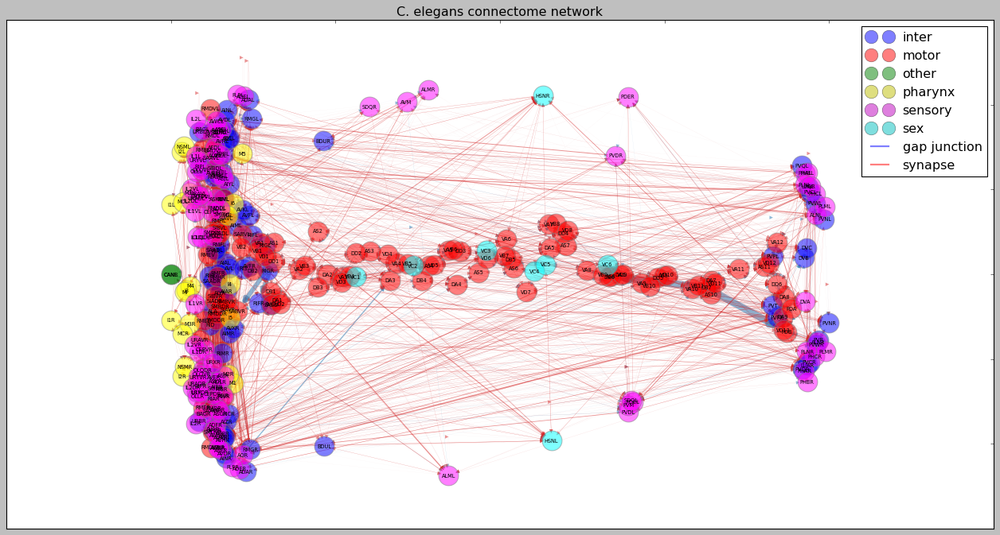

In [ ]:
# @title Graph of the *C. elegans* connectome.
# @markdown

from worm_utils import draw_connectome

draw_connectome(graph)

# *C. elegans* neural prediction with a GNN.

Now that we have the connectome graph, we can train a Graph Neural Network (with architecture/flavor of our choosing) to perform a semi-supervised task (e.g. time series prediction).

## Placing neural data onto connectome graph.

When we made the connectome graph, we initialized the nodes features 
to be $1024$ timesteps of uniform random (interval $[0,1]$) noise. 
Indeed, if we skip or comment out this cell and train a GNN with these
random node features the network learns to predict the mean ($\sim0.5$) 
in order to minimize the loss!

To do something hopefully a bit more 
interesting, we will substitute the node features for as many neurons
as we have the real data for.

We have developed a way to map 
neuron identity to the corresponding activity traces. For neurons whose identities are unknown, we will set their features to be constant at $0$.

How much real data do we have? torch.Size([2397, 143])
Current data on connectome graph: (302, 1024)
Attributes: 
 ['edge_attr', 'y', 'x', 'num_classes', 'n_id', 'node_type', 'id_neuron', 'pos', 'edge_index'] 
 Num. nodes 51, Num. edges 269, Num. node features 2397
	Has isolated nodes: True
	Has self-loops: True
	Is undirected: False
	Is directed: True


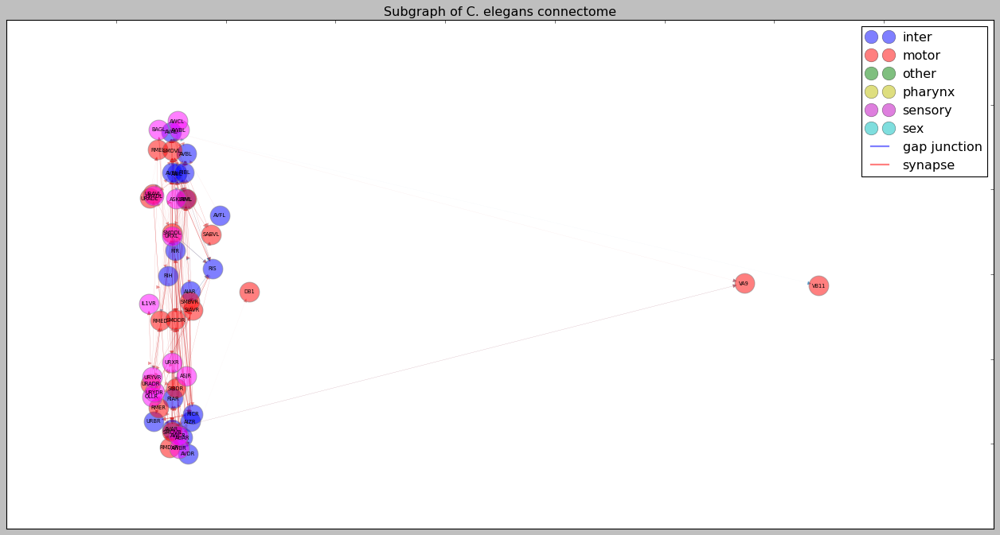

In [ ]:
# @title Replace the random data on the nodes with real data.
# @markdown

from worm_utils import graph_inject_data, add_train_val_mask

# inject real data
graph, subgraph, subgraph_mask = graph_inject_data(single_worm_dataset, graph)
subgraph.num_classes = len(subgraph.node_type)

# add a train and validation mask
subgraph = add_train_val_mask(subgraph, train_ratio=0.6)

# draw the sub-network of labelled neurons
draw_connectome(subgraph, plt_title="Subgraph of C. elegans connectome")

In [ ]:
# @title Example of how to use `NeighborLoader`.
# @markdown

subgraph_loader = NeighborLoader(
    subgraph, input_nodes=None, batch_size=1, num_neighbors=[-1], shuffle=True
)
gen = iter(subgraph_loader)
sample = next(gen)
sample.id_neuron = {
    i: graph.id_neuron[k] for i, k in enumerate(sample.n_id.cpu().numpy())
}
sample.pos = {i: graph.pos[k] for i, k in enumerate(sample.n_id.cpu().numpy())}

print(sample.num_nodes)
print(sample.batch_size),
print(sample.y),
print(sample.n_id),
print(sample.n_id[sample.edge_index])
print(sample)

7
1
tensor([4., 0., 4., 0., 0., 0., 4.], device='cuda:0')
tensor([255,  52,  78, 192, 203, 253, 257], device='cuda:0')
tensor([[ 52,  78, 192, 203, 253, 257],
        [255, 255, 255, 255, 255, 255]], device='cuda:0')
Data(
  x=[7, 2397],
  edge_index=[2, 6],
  edge_attr=[6, 2],
  y=[7],
  pos={
    0=[2],
    1=[2],
    2=[2],
    3=[2],
    4=[2],
    5=[2],
    6=[2]
  },
  node_type={
    0.0='InterNeurons',
    1.0='MotorNeurons',
    2.0='OtherEndOrgans',
    3.0='Pharynx',
    4.0='SensoryNeurons',
    5.0='SexSpecificCells'
  },
  num_classes=6,
  id_neuron={
    0='URXR',
    1='AUAR',
    2='BAGL',
    3='RICR',
    4='RIR',
    5='URBR',
    6='URYDR'
  },
  n_id=[7],
  train_mask=[7],
  val_mask=[7],
  input_id=[1],
  batch_size=1
)
